In [0]:
import random, time, json, glob

from tabulate import tabulate

import pandas as pd
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

import scipy.misc as scp_misc
import scipy.ndimage as ndimage

from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

try:
    from sklearn.utils.fixes import signature
except:
    from inspect import signature

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader, sampler
from torchvision import datasets, models, transforms

from aux import func as dl

from PIL import Image
%matplotlib inline

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Assume that we are on a CUDA machine, then this should print a CUDA device:
print(device)
if device == 'cuda':
    print(torch.cuda.get_device_name(0))

cuda


In [5]:
DIR_BAS = '/home/cc_clas/dataset/'
model_save = 'model_da_80.pth'

mycmap = dl.transparent_cmap(plt.cm.Reds)

labeled_file = '{}labels.csv'.format(DIR_BAS)

all_labels = pd.read_csv(labeled_file,sep=',')

group_opts = ['Freesurfer','Manual','Pardoe']

dirs_all = []
labels_all = []
for group_opt in group_opts:
    str_add = ''
    if group_opt == 'Freesurfer':
        str_add = 'T1_'

    list_opt = all_labels.loc[(all_labels['Label'] != -1) & (all_labels['Label'] != 2) & (all_labels['Group'] == group_opt)]
    dirs_all += ['{}{}/{}{:06.0f}/'.format(DIR_BAS,group_opt.lower(),str_add,cod) for cod in list_opt.Subject]
    labels_all += list(list_opt.Label)

print('Found dirs:',len(dirs_all))

Found dirs: 688


In [6]:
#Filtering different shapes

new_folders = dl.assert_dataset(dirs_all)
print(len(new_folders))
print(new_folders)

new_folders = np.array(new_folders)

685


In [7]:
n_samples = len(new_folders)
print('Size dataset: ', n_samples)
indices = np.array(range(n_samples))

split = 16

load_sets = True
if load_sets:
    with open('/home/cc_clas/CC_clas_svm/aux/data_split_80_20.txt') as f:
        data_split = json.load(f)

    train_folders = data_split['train']
    test_folders = data_split['test']
    n_test = len(test_folders)
else:
    np.random.seed(88)
    n_test = split*4
    test_idx = np.random.choice(np.array(indices), size=n_test, replace=False)
    train_idx = list(set(indices) - set(test_idx))

    train_folders = new_folders[train_idx]
    test_folders = new_folders[test_idx]

    if False:
        data_dict = {}
        data_dict['train'] = list(train_folders)
        data_dict['test'] = list(test_folders)

        with open('/home/cc_clas/CC_clas_svm/save/', 'w') as outfile:
            json.dump(data_dict, outfile)

print('Train: {} / Test: {}'.format(len(train_folders),len(test_folders)))

Size dataset:  685
Train: 549 / Test: 136


In [8]:
train_folders_upd = train_folders

print('Train set: ({})'.format(len(train_folders_upd)/n_samples),len(train_folders_upd))
print('Test set: ({})'.format(len(test_folders)/n_samples), len(test_folders))

Train set: (0.8014598540145985) 549
Test set: (0.19854014598540146) 136


In [0]:
ValsNormalize = {'mean': np.array([0.485, 0.456, 0.406]),'std': np.array([0.229, 0.224, 0.225])}

transformed_data_train = dl.MRIDataset_list(list_dirs=train_folders_upd, df_labels=all_labels,
                                            transform=transforms.Compose([dl.ToNormalize(ValsNormalize),
                                                                          dl.ToRotate(3),
                                                                          dl.ToCrop(32),
                                                                          dl.ToTensor(),
                                                                         ]))
train_loader = DataLoader(transformed_data_train, batch_size=split, shuffle=True)

transformed_data_test = dl.MRIDataset_list(list_dirs=test_folders, df_labels=all_labels,
                                           transform=transforms.Compose([dl.ToNormalize(ValsNormalize),
                                                                         dl.ToCrop(32),
                                                                         dl.ToTensor(),
                                                                        ]))
test_loader = DataLoader(transformed_data_test, batch_size=n_test, shuffle=False)

New dataset size (Leaving out sized-different subjects):  685
====== Train Dataloader ======


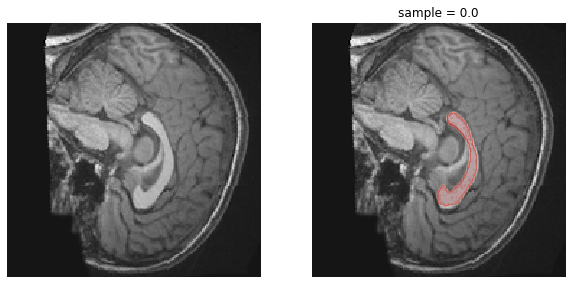

====== Test Dataloader ======


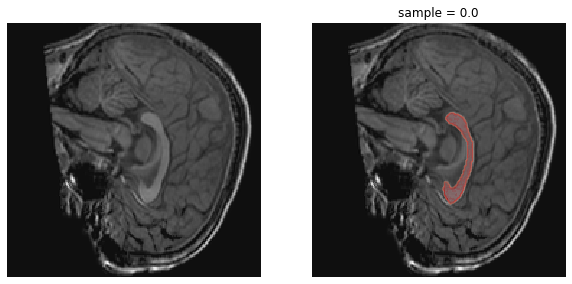

In [0]:
print('New dataset size (Leaving out sized-different subjects): ', n_samples)
print('====== Train Dataloader ======')
for i_batch, sample_batched in enumerate(train_loader):
    image, label = sample_batched['image'], sample_batched['label']
    random_index = random.randint(0, image.size()[0]-1)
    dl.plot_img_mask(image[random_index], label[random_index])
    if i_batch == 0:
        break
print('====== Test Dataloader ======')
for i_batch, sample_batched in enumerate(test_loader):
    image, label = sample_batched['image'], sample_batched['label']
    random_index = random.randint(0, image.size()[0]-1)
    dl.plot_img_mask(image[random_index], label[random_index])
    if i_batch == 0:
        break

New dataset size (Leaving out sized-different subjects):  685
====== Train Dataloader ======


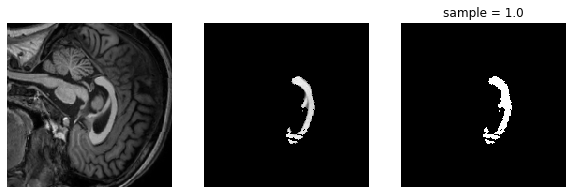

====== Test Dataloader ======


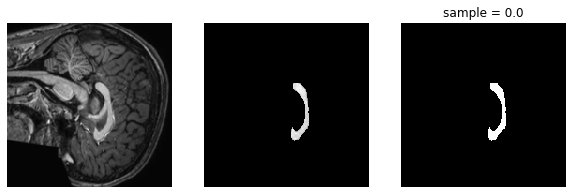

In [0]:
print('New dataset size (Leaving out sized-different subjects): ', n_samples)
print('====== Train Dataloader ======')
for i_batch, sample_batched in enumerate(train_loader):
    image, label = sample_batched['image'], sample_batched['label']
    random_index = random.randint(0, image.size()[0]-1)
    dl.plot_channels(image[random_index], label[random_index])
    if i_batch == 0:
        break
print('====== Test Dataloader ======')
for i_batch, sample_batched in enumerate(test_loader):
    image, label = sample_batched['image'], sample_batched['label']
    random_index = random.randint(0, image.size()[0]-1)
    dl.plot_channels(image[random_index], label[random_index])
    if i_batch == 0:
        break

In [10]:
# define the CNN architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        # Load the pretrained model from pytorch
        self.ext_ftr = models.resnet18(pretrained=True)
        
        self.ext_ftr = nn.Sequential(*list(self.ext_ftr.children())[:-2])
        
        # Freeze training for all "features" layers
        for param in self.ext_ftr[:-1].parameters():
            param.requires_grad = False
            
        # Freeze training for all "features" layers
        for param in self.ext_ftr[-1][0].parameters():
            param.requires_grad = False
        
        self.fc1 = nn.Linear(18432, 1024)
        self.dropout1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(1024, 512)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(512, 2)

    def forward(self, x):
        
        y = self.ext_ftr(x)
        y = y.view(-1, 18432)
        y = self.dropout1(F.relu(self.fc1(y)))
        y = self.dropout2(F.relu(self.fc2(y)))
        return self.fc3(y)

# create a complete CNN
model = Net()

# if GPU is available, move the model to GPU
if device == 'cuda':
    model.cuda()

print(model)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/checkpoints/resnet18-5c106cde.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 27.5MB/s]


Net(
  (ext_ftr): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

In [11]:
# Parameters to update by fine tuning
print("Params to learn:")

params_to_update = []
for name,param in model.named_parameters():
    if param.requires_grad == True:
        params_to_update.append(param)
        print(name)

# specify optimizer (stochastic gradient descent) only for params_to_update
optimizer = torch.optim.Adam(model.parameters(), lr=0.00001)

# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

Params to learn:
ext_ftr.7.1.conv1.weight
ext_ftr.7.1.bn1.weight
ext_ftr.7.1.bn1.bias
ext_ftr.7.1.conv2.weight
ext_ftr.7.1.bn2.weight
ext_ftr.7.1.bn2.bias
fc1.weight
fc1.bias
fc2.weight
fc2.bias
fc3.weight
fc3.bias


In [12]:
epochs = 50
temp_save = './'

path_m = '{}{}'.format(temp_save,model_save)
ptnc = 5

tr_loss, vl_loss = dl.train_epoch(train_loader,test_loader,model,criterion,optimizer,
                               model_path=path_m,epochs=epochs,max_patience=ptnc)

Loading model...
There is no checkpoint to be loaded
Training for 50 epochs
Epoch: [1/50]	Time: 1496.800	Loss: [train>0.572/val>0.449]	Acc 0.824
Validation loss decreased: inf --> 0.448905
Saving model...
Model saved at ./model.pth
Epoch: [2/50]	Time: 941.757	Loss: [train>0.387/val>0.343]	Acc 0.853
Validation loss decreased: 0.448905 --> 0.343391
Saving model...
Model saved at ./model.pth
Epoch: [3/50]	Time: 919.701	Loss: [train>0.310/val>0.291]	Acc 0.890
Validation loss decreased: 0.343391 --> 0.290627
Saving model...
Model saved at ./model.pth
Epoch: [4/50]	Time: 895.976	Loss: [train>0.276/val>0.245]	Acc 0.912
Validation loss decreased: 0.290627 --> 0.245414
Saving model...
Model saved at ./model.pth
Epoch: [5/50]	Time: 886.595	Loss: [train>0.247/val>0.239]	Acc 0.897
Validation loss decreased: 0.245414 --> 0.238649
Saving model...
Model saved at ./model.pth
Epoch: [6/50]	Time: 927.116	Loss: [train>0.222/val>0.209]	Acc 0.941
Validation loss decreased: 0.238649 --> 0.209178
Saving mode

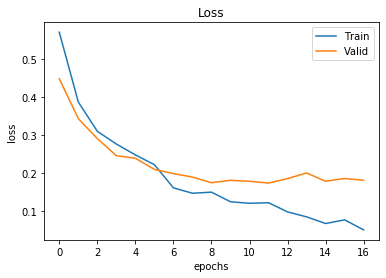

In [13]:
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.plot(tr_loss.vc[:], label='Train')
plt.plot(vl_loss.vc[:], label='Valid')
plt.legend()
plt.show()

Testing...
torch.Size([136, 3, 176, 176]) torch.Size([136])
Final AUC:  0.9798907103825136
------------------------------------
ROC Curve Teste:


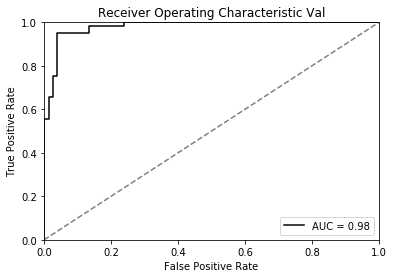

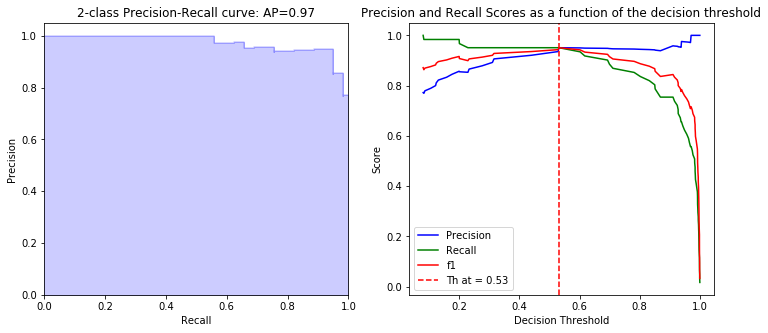

Best separation threshold: 0.5313315987586975


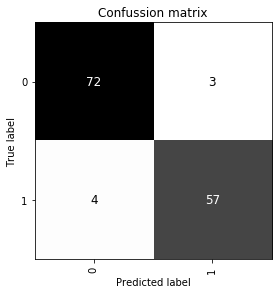

===== Final Report =====
+-----------+----------+
| Metric    |    Value |
+===========+==========+
| AUC       | 0.979891 |
+-----------+----------+
| Accuracy  | 0.948529 |
+-----------+----------+
| Recall    | 0.934426 |
+-----------+----------+
| Precision | 0.95     |
+-----------+----------+
| F1        | 0.942149 |
+-----------+----------+
Predict:  tensor([[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1,
         0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1,
         1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
         0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
         0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0,
         0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]])
Targets:  tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
        0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1,
      

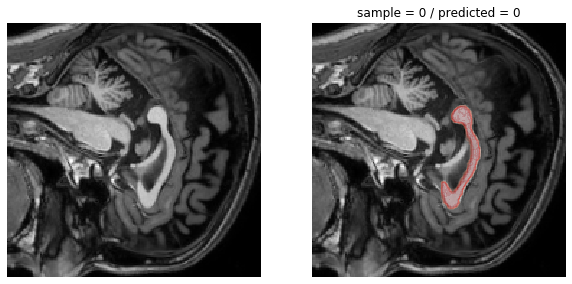

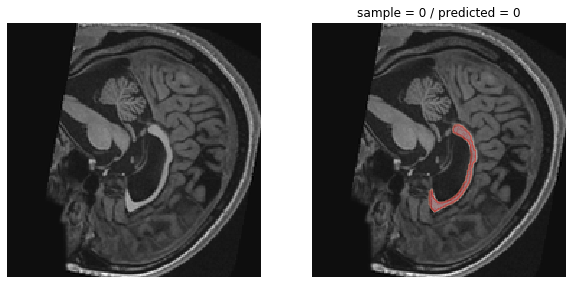

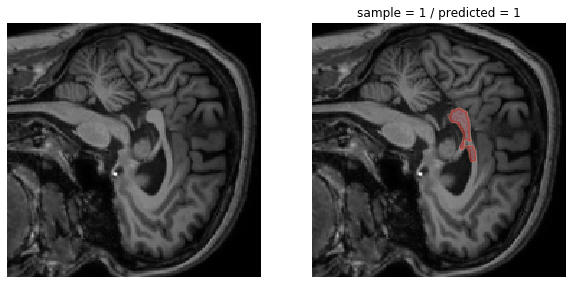

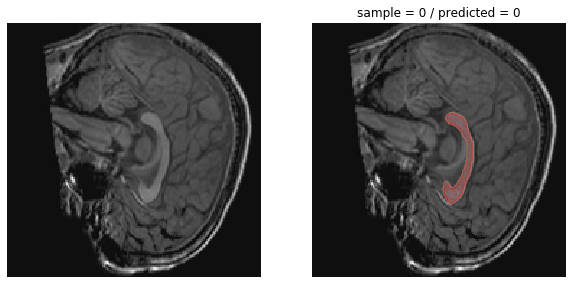

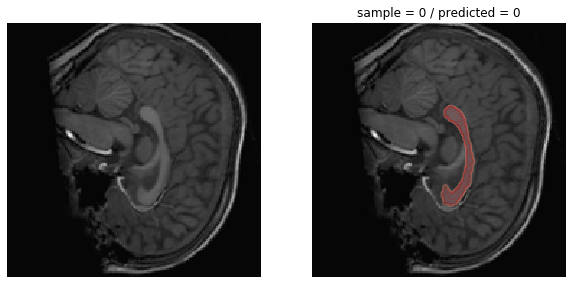

...

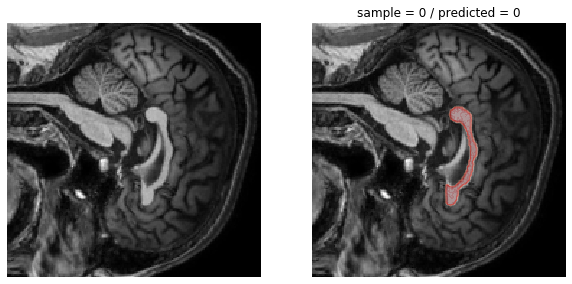

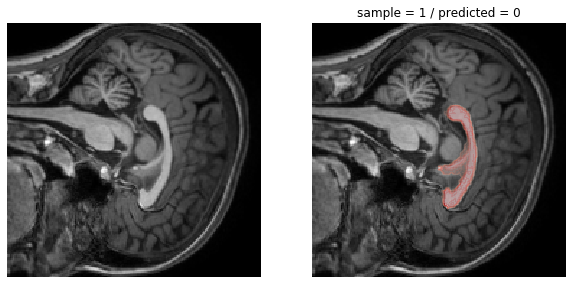

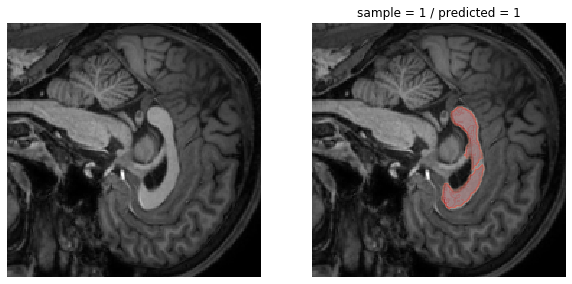

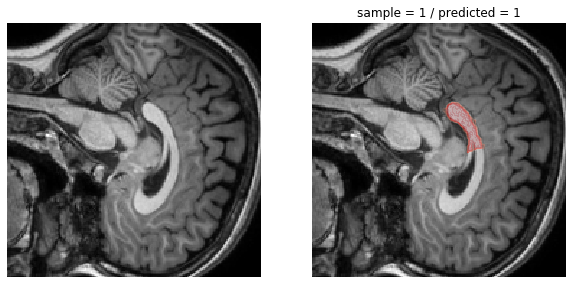

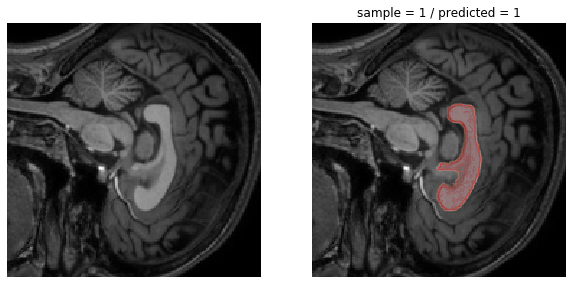

In [20]:
path_m = '{}{}'.format(temp_save,model_save)
model_dic = torch.load(path_m, map_location='cpu')

model.load_state_dict(model_dic['model_state_dict'])
predicted = dl.test(test_loader, model)